## Feature Engineering

In this notebook we transform the data into feature vectors. We want the feature vectors to capture information about the messages which we can then use to identify the category or classification of message.

We begin by loading in our training set:

In [1]:
import numpy as np
import pandas as pd

In [2]:
training_data = pd.read_parquet("./data/training.parquet")
training_data.sample(10)

,Category,Text
16917,sci.space,In article <1sti5kINNoq4@gap.caltech.edu> palm...
4637,rec.sport.baseball,scottm@helena.stat.uga.edu (scott mclure) writ...
8416,sci.med,In article <1qi2h1INNr3o@roundup.crhc.uiuc.edu...
4456,rec.sport.baseball,\nSince Roger is a Canadian who probably knows...
978,talk.politics.mideast,\nFrom Israeline 4/27/93\n\nPeace Talks Resume...
16570,sci.space,"in article <1rpv9o$k00@wraith.cs.uow.edu.au>, ..."
13618,comp.sys.ibm.pc.hardware,In article <1993Apr21.011615.6677@ultb.isc.rit...
11009,comp.windows.x,In article <TKLD.93Apr2123341@burns.cogsci.ed....
5292,comp.os.ms-windows.misc,I have just noticed my FileManager doing somet...
12377,comp.graphics,TO: rych@festival.ed.ac.uk (R Hawkes)\n\nRH>I'...


The data contains two columns, one holding the message and one for the category to which that message belongs.

We want to transform each of the messages into a numeric vector. One way to do this would be to, for each message, allocate an extremely large vector, with one bit for every possible word. We could then set each bit to 'True' or '1' if the corresponding word appears in that message. In practice this is not practical because of the huge memory requirements. As such we use a 'hashing vectoriser' which _hashes_ the words to vectors of a fixed, finite size. 

You can see that many of the messages contain non-standard words, such as email addresses. It is common practice to ignore such non-standard words during the feature engineering stage, so we set a 'token_pattern' parameter to ensure that only standard words are hashed. 

If you're interested in experimenting, why not try training models with and without these words and see how model performance changes?

We also want to remove any 'stop words' from the text. We do this by setting 'stop_words='english''. 

In [3]:
from sklearn.feature_extraction.text import HashingVectorizer
BUCKETS=2048

hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
hv

HashingVectorizer(alternate_sign=False, n_features=2048, norm=None,
                  stop_words='english', token_pattern='(?u)\\b[A-Za-z]\\w+\\b')

In [4]:
hvcounts = hv.fit_transform(training_data["Text"])
hvcounts

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

Each of the 13,947 messages is now represented by one vector of length 'BUCKETS'. 

#### Term Frequency - inverse document frequency (TF-idf)

Let's use term frequency-inverse document frequency, or tf-idf, to generate feature vectors. Tf-idf is commonly used to summarise text data, and it aims to capture how important different words are within a set of documents. Tf-idf combines a normalized word count (or term frequency) with the inverse document frequency (or a measure of how common a word is across all documents) in order to identify words, or terms, which are 'interesting' or important within the document, with respect to the set of documents. 

In [5]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
hvdf_tfidf = tfidf_transformer.fit_transform(hvcounts)

In [6]:
hvdf_tfidf

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

It's a good idea to visualise your data at this point - we want to visualise the feature vectors to see if we can identify any clustering or structure in them that could be used to distinguish between messages belonging to different categories.

The vectors are 2048 dimensions (unless you changed the `BUCKETS` parameter), so it's not possible to plot them as they are! Instead we will use Principal Component Analysis (PCA) to project the data down to two dimensions, which we can then plot:

In [7]:
import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.TruncatedSVD(DIMENSIONS)
pca_a = pca2.fit_transform(hvdf_tfidf)

In [ ]:
pca_a = pca2.fit_transform(feature_vecs_before_time_t)
pca_b = pca2.transform(feature_vectors_after_time_t)

In [8]:
pca_df = pd.DataFrame(pca_a, columns=["x", "y"])
pca_df.sample(10)

,x,y
3717,0.152154,0.069335
12446,0.339280,-0.140294
5486,0.151575,0.147026
6390,0.173649,-0.021634
7745,0.236513,0.025479
3116,0.187921,0.002060
13,0.353837,-0.083354
13891,0.136260,-0.024546
12439,0.113527,0.035452
9777,0.121452,0.036727


In [9]:
plot_data = pd.concat([training_data.reset_index(), pca_df], axis=1)

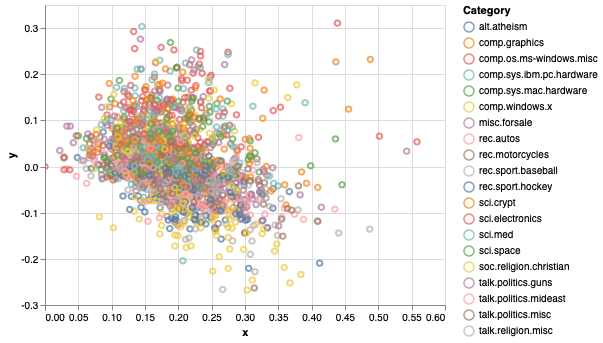

In [10]:
import altair as alt

alt.renderers.enable('notebook')
alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="Category").mark_point().interactive()

The plot above shows no clear clustering within classes. However, this is expected for a couple of reasons:
    1. We are mapping from a 2048 dimensional space down to 2 dimensions. This is a huge reduction in dimensions and as such we lose some information.
    2.  We are plotting 20 different categories on one plot - it's difficult to see what's going on clearly with all those colours. 
    
Instead we want to plot each category individually against all other categories. This one-vs-all plot may enable us to see any clusters more clearly:

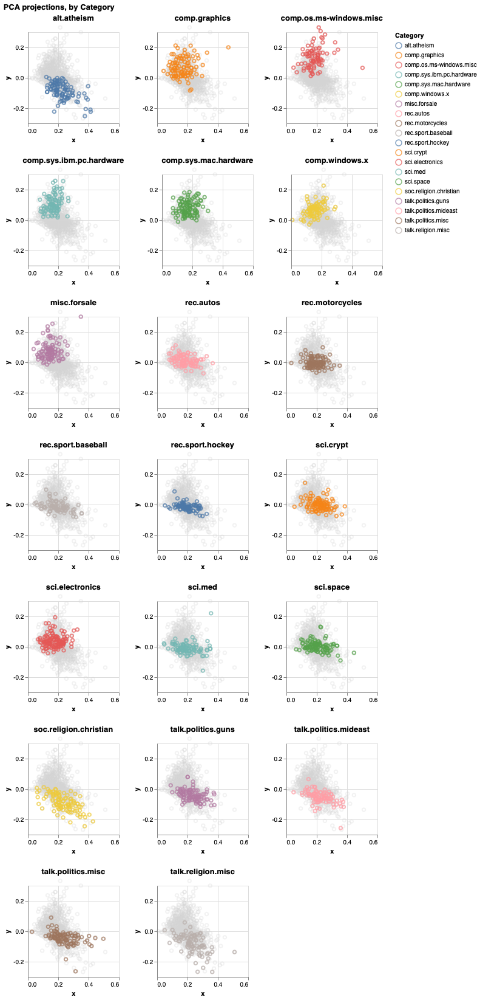

In [11]:
import altair as alt
from altair.expr import datum

data=plot_data.sample(2000)

base = alt.Chart(data).mark_point().encode(
    alt.X('x', scale=alt.Scale(domain=(0, 0.6))),
    alt.Y('y', scale = alt.Scale(domain = (-0.3, 0.3))),
    color='Category:N'
)

## Make gray points for background
chart1 = alt.Chart(data.sample(1000)) \
            .encode(x="x", y="y") \
            .mark_point(opacity=0.3, color="lightgray")


def overlay_make_chart(base_chart, category, options, chart1):
    title = category
    chart2 = base_chart\
      .transform_filter(datum.Category == category)\
      .properties(width=options['width'], 
                    height=options['height'], title=title)
    chart = chart1 + chart2
    return chart


options = {'width': 150, 'height': 150}
charts = [overlay_make_chart(base, category, options, chart1) \
          for category in sorted(data.Category.unique())]

# make a single row
def make_chart_row(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    row = alt.HConcatChart(hconcat=hconcat)
    return row

# take an array of charts and produce a facet grid
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [
        charts[i:i+charts_per_row] 
        for i in range(0, len(charts), charts_per_row)]        
    vconcat = [make_chart_row(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat)\
      .configure_axisX(grid=True)\
      .configure_axisY(grid=True)
    return vcc

# assemble the facet grid
compound_chart = facet_wrap(charts, charts_per_row=3)
compound_chart.properties(title='PCA projections, by Category')

This facet plot shows that the PCA projections are clustering by category, thus indicating that our feature engineering approach is able to identify structure in our data. 

As such, we are happy with our feature engineering technique and will save the transformation steps as a pipeline stage. 

In [12]:
from sklearn.pipeline import Pipeline 

BUCKETS=2048
hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
tfidf = TfidfTransformer()
feat_pipeline = Pipeline([('vect',hv), ('tfidf',tfidf)])

In [13]:
from mlworkflows import util

util.serialize_to(feat_pipeline, "feature_pipeline.sav")